In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/lendingclub-issued-loans/new.html
/kaggle/input/lendingclub-issued-loans/us-state-codes.csv
/kaggle/input/lendingclub-issued-loans/lc_loan.csv
/kaggle/input/lendingclub-issued-loans/lc_2016_2017.csv


# Lending Club Loan - Data Exploration

#### Import Libraries

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', None)

In [4]:
data = pd.read_csv("/kaggle/input/lendingclub-issued-loans/lc_loan.csv",low_memory=False)

In [5]:
print("Size of dataset -",data.shape)
display(data.head(5))

Size of dataset - (887379, 74)


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,1077501,1296599,5000.0,5000.0,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-2011,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-1985,1.0,NaN,NaN,3.0,0.0,13648.0,83.7,9.0,f,0.0,0.0,5861.071414,5831.78,5000.00,861.07,0.00,0.00,0.00,Jan-2015,171.62,NaN,Jan-2016,0.0,NaN,1.0,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1077430,1314167,2500.0,2500.0,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-2011,Charged Off,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0.0,Apr-1999,5.0,NaN,NaN,3.0,0.0,1687.0,9.4,4.0,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-2013,119.66,NaN,Sep-2013,0.0,NaN,1.0,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1077175,1313524,2400.0,2400.0,2400.0,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-2011,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,small_business,real estate business,606xx,IL,8.72,0.0,Nov-2001,2.0,NaN,NaN,2.0,0.0,2956.0,98.5,10.0,f,0.0,0.0,3003.653644,3003.65,2400.00,603.65,0.00,0.00,0.00,Jun-2014,649.91,NaN,Jan-2016,0.0,NaN,1.0,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1076863,1277178,10000.0,10000.0,10000.0,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-2011,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0.0,Feb-1996,1.0,35.0,NaN,10.0,0.0,5598.0,21.0,37.0,f,0.0,0.0,12226.302212,12226.30,10000.00,2209.33,16.97,0.00,0.00,Jan-2015,357.48,NaN,Jan-2015,0.0,NaN,1.0,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1075358,1311748,3000.0,3000.0,3000.0,60 months,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-2011,Current,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0.0,Jan-1996,0.0,38.0,NaN,15.0,0.0,27783.0,53.9,38.0,f,766.9,766.9,3242.170000,3242.17,2233.10,1009.07,0.00,0.00,0.00,Jan-2016,67.79,Feb-2016,Jan-2016,0.0,NaN,1.0,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Data Exploration / Analysis

#### How many people own their house

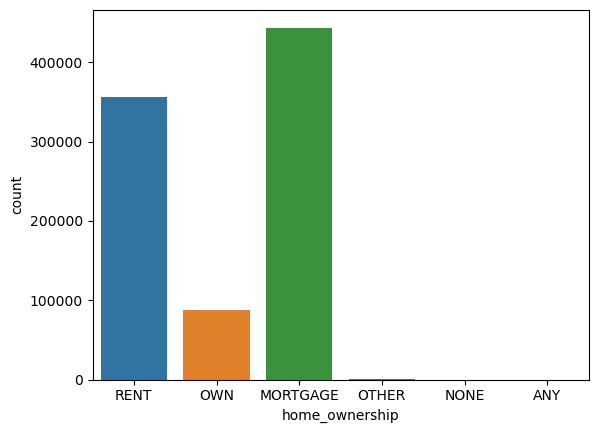

In [6]:
sns.countplot(data=data,x='home_ownership')
plt.show()

Maximum customers using mortrage type of loans

#### Loan Amount (Applied for) vs. Funded Amount

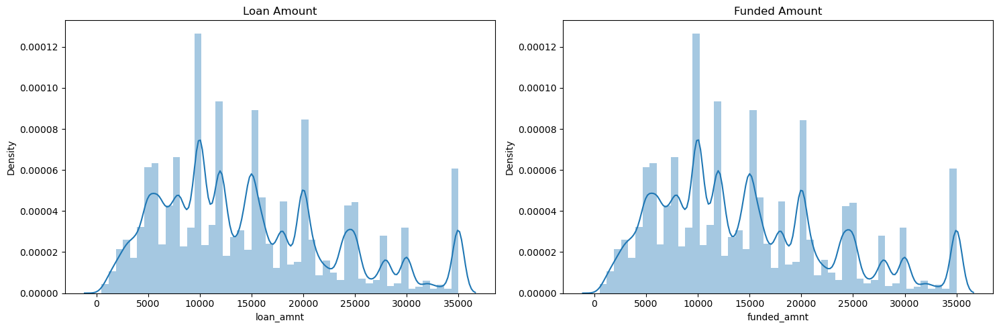

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
sns.distplot(data.loan_amnt, ax=axes[0])
axes[0].set_title('Loan Amount')
sns.distplot(data.funded_amnt, ax=axes[1])
axes[1].set_title('Funded Amount')
plt.tight_layout()
plt.show()

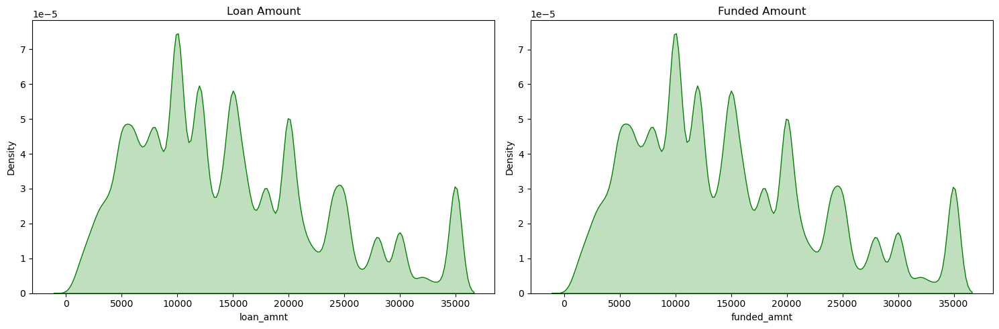

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
sns.kdeplot(data.loan_amnt, ax=axes[0],color="green",shade=True)
axes[0].set_title('Loan Amount')
sns.kdeplot(data.funded_amnt, ax=axes[1],color="green",shade=True)
axes[1].set_title('Funded Amount')
plt.tight_layout()
plt.show()

The loan amount applied by borrower and loan amount funded by lender their distribution plots look quite similar

#### Term Distribution

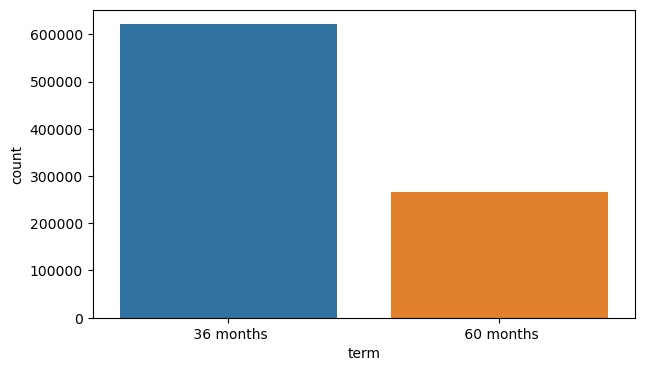

In [9]:
plt.figure(figsize=(7,4))
sns.countplot(data=data,x=data.term)
plt.show()

There are only two types of term 36 months & 60 months

#### Interest Rate distribution & relation with other variables

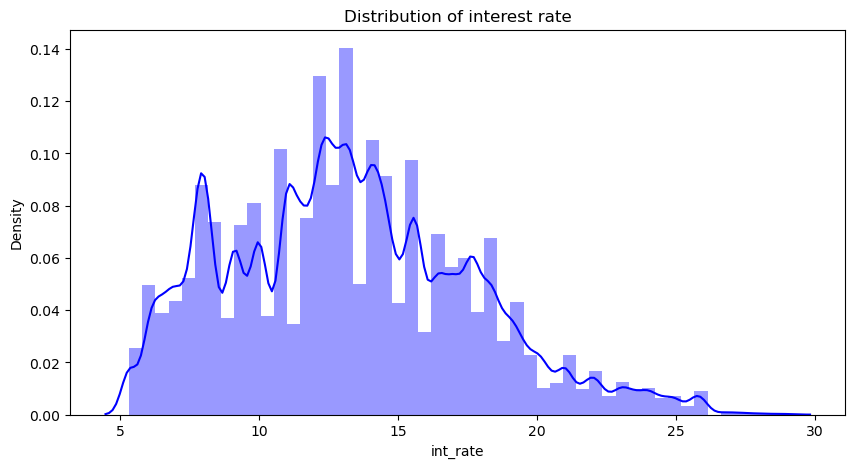

In [10]:
plt.figure(figsize=(10,5))
sns.distplot(data.int_rate, color ='blue')
plt.title("Distribution of interest rate")
plt.show()

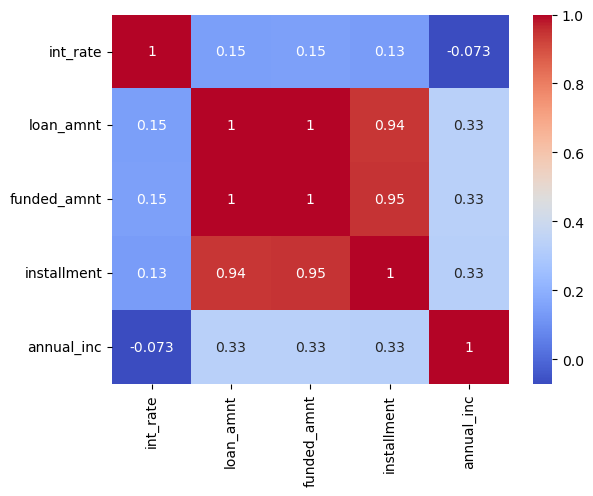

In [11]:
correlation_matrix = pd.DataFrame({'int_rate': data.int_rate, 'term': data.term, 'loan_amnt':data.loan_amnt, 
                                  'funded_amnt': data.funded_amnt, 'installment':data.installment,
                                  'emp_length':data.emp_length, 'annual_inc':data.annual_inc }).corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.show()

#### Grade

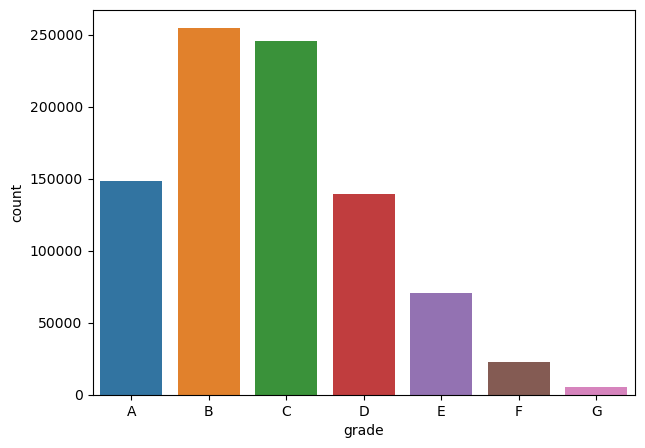

In [12]:
data = data.sort_values('grade', ascending=True)
plt.figure(figsize=(7,5))
sns.countplot(data=data,x=data.grade)
plt.show()

Grades are from A to G. the A being the highest-grade, G being the lowest-grade based on borrower credit quality and underlying risk

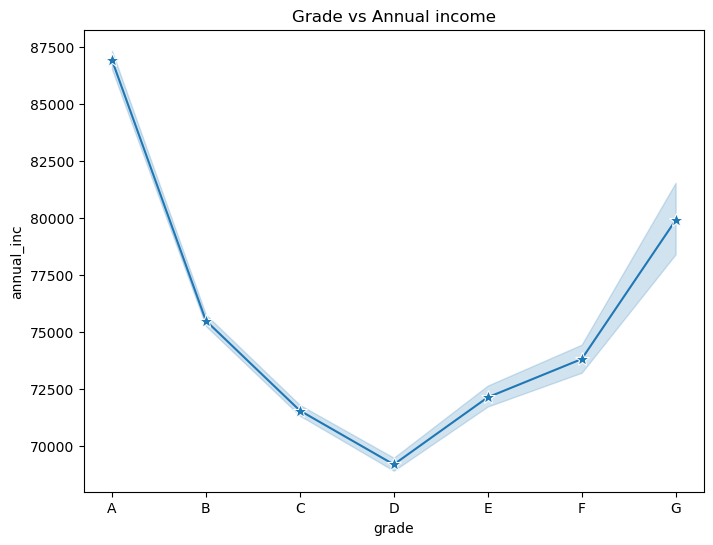

In [13]:
plt.figure(figsize=(8,6))
sns.lineplot(data=data, y='annual_inc', x='grade',marker='*',markersize=10)
plt.title("Grade vs Annual income")
plt.show()

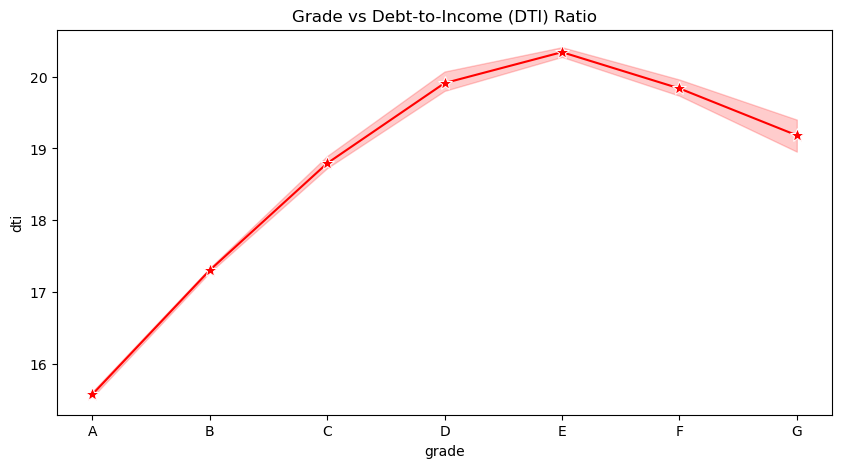

In [14]:
plt.figure(figsize=(10,5))
sns.lineplot(data=data, y='dti', x='grade', color='red',marker='*',markersize=10)
plt.title("Grade vs Debt-to-Income (DTI) Ratio")
plt.show()

 A high DTI ratio can signal that an individual has too much debt for the amount of income earned each month

#### issue_date month which the loan was funded

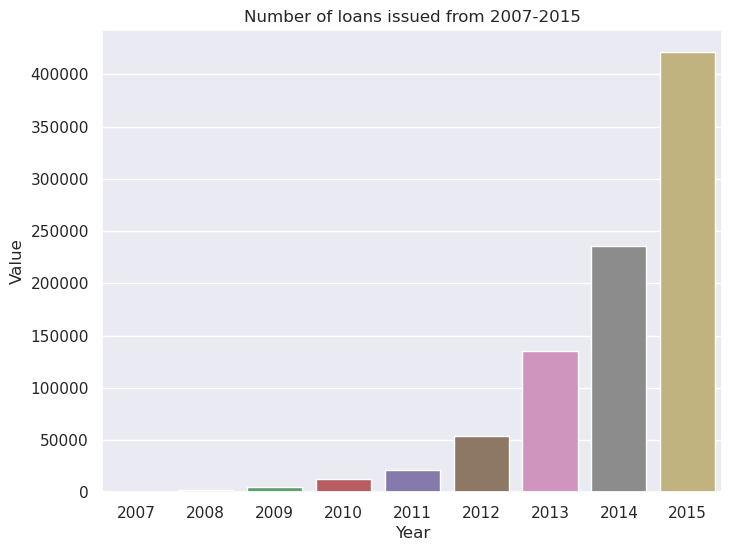

In [15]:
data['year'] = pd.DatetimeIndex(data['issue_d']).year

value_counts = data.year.value_counts()
yd = value_counts.reset_index().rename(columns={'index':'value',0:'count'})
sns.set(style='darkgrid')
plt.figure(figsize=(8, 6))
sns.barplot(x='value', y='year', data=yd)
plt.xlabel('Year')
plt.ylabel('Value')
plt.title('Number of loans issued from 2007-2015')
plt.show()

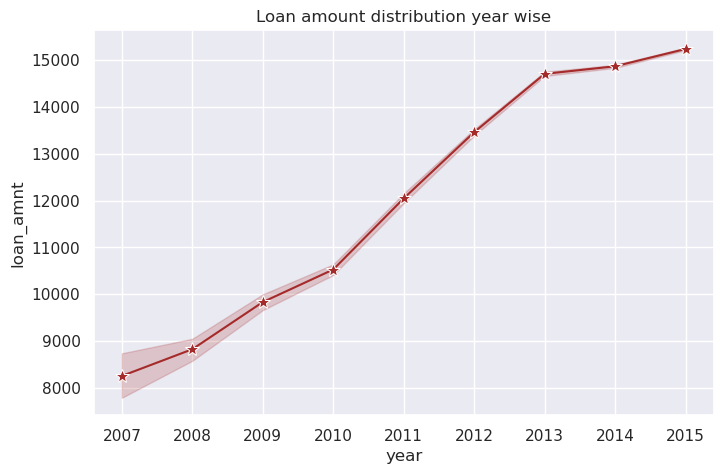

In [16]:
plt.figure(figsize=(8,5))
sns.lineplot(data=data,x='year',y='loan_amnt',color='brown',marker='*',markersize=10)
plt.title('Loan amount distribution year wise')
plt.show()

Loan Status Distribution

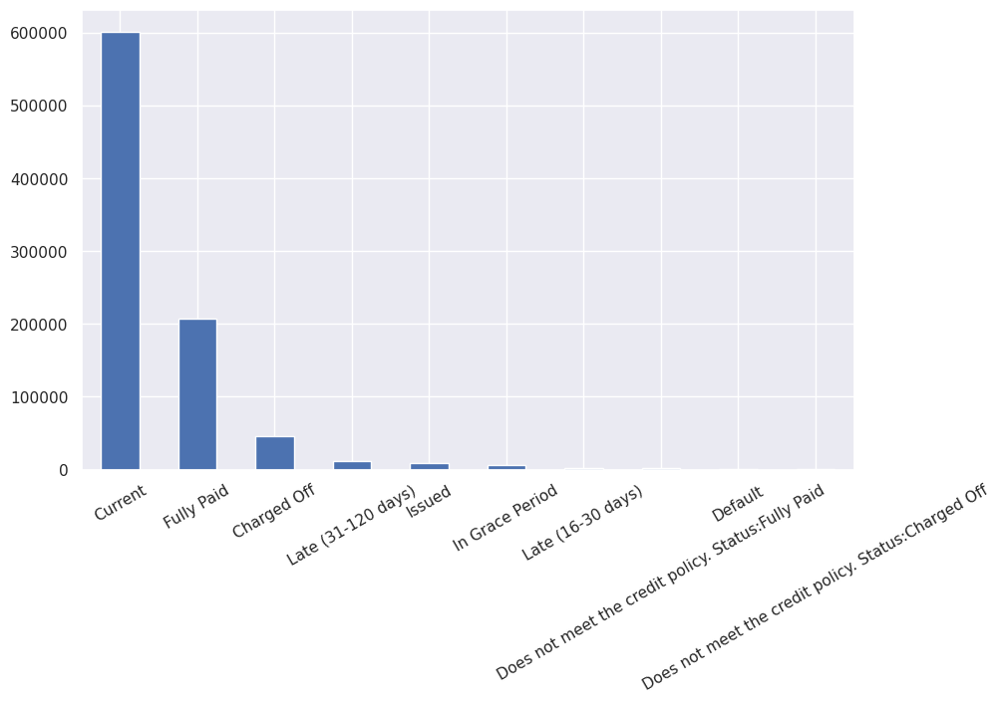

In [17]:
data.loan_status.value_counts().plot(kind='bar',rot=30,figsize=(10,6))
plt.show()

In [18]:
fig = px.histogram(data, x="loan_status",color="home_ownership", title="Loan status vs Home ownership")
fig.show()

#### Purpose of loans

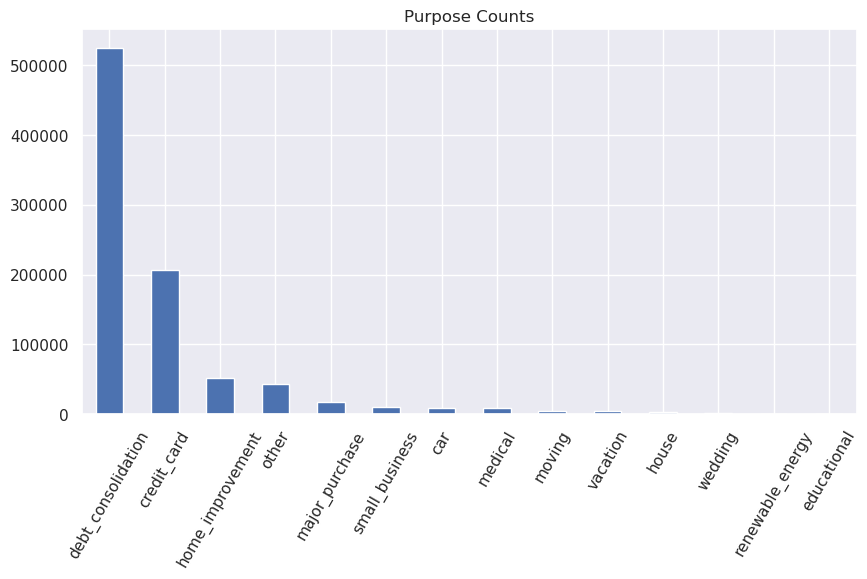

In [19]:
data.purpose.value_counts().plot(kind='bar',rot=60,figsize=(10,5))
plt.title('Purpose Counts')
plt.show()

#### Risky vs. Not risky loans

In [20]:
data['loan_status_class'] = data['loan_status'].replace({'Late (31-120 days)': 'risky','Late (16-30 days)': 'risky', 
                                'Does not meet the credit policy. Status:Charged Off': 'risky',
                 'Does not meet the credit policy. Status:Fully Paid':'not risky','In Grace Period':'risky','Current':'not risky',
                    'Fully Paid':'not risky', 'Charged Off':'risky','Default':'risky','Issued':'not risky'})

In [ ]:
plt.figure(figsize=(7,7))
data.loan_status_class.value_counts().plot.pie(shadow='True' ,autopct='%1.2f%%', startangle = 75)
plt.show()

In [ ]:
pc = data.groupby(['loan_status_class','purpose']).size().reset_index(name='counts')
plt.figure(figsize=(15,6))
sns.barplot(data=pc,x='purpose',y='counts',hue='loan_status_class')
plt.title('Purpose vs Risk')
plt.xticks(rotation=45)
plt.show()

In [ ]:
el = data.groupby(['loan_status_class','emp_length']).size().reset_index(name='counts')
plt.figure(figsize=(15,6))
sns.barplot(data=el,x='emp_length',y='counts',hue='loan_status_class')
plt.title('Employee job length vs Risk')
plt.show()

#### Lending loan amount year wise

In [ ]:
sns.barplot(data=data,x='year',y='loan_amnt')
plt.show()

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(data=data,x="year", y="funded_amnt",hue='loan_status_class',ci = None)
plt.title("Funded amount year wise and Risk")
plt.show()

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(data=data,x="grade",hue='loan_status_class')
plt.title("Grade year wise and Risk")
plt.show()

In [ ]:
data.emp_title.value_counts().to_frame()[0:20].plot(kind='bar',figsize=(15,6),color='#091238')
plt.title('Top 20 employees types borrow more loans')
plt.show()

In [ ]:
al = data.groupby(['addr_state','loan_status_class']).count().reset_index()
al = al[['addr_state','loan_status_class','id']]
al = al[al['loan_status_class'] == 'risky']
al = al.sort_values(by='id',ascending=False)

plt.figure(figsize=(17,6))
sns.barplot(data=al,x='addr_state',y='id', hue='loan_status_class')
plt.ylabel('Count')
plt.xlabel('States')
plt.title('State vs Risk')
plt.show()

In [ ]:
gya = data.groupby(['grade','year'])['annual_inc'].mean().reset_index()
gyl = data.groupby(['grade','year'])['loan_amnt'].mean().reset_index()

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
sns.lineplot(x=gya.year, y=gya.annual_inc, hue=gya.grade, ax=axes[0])
axes[0].set_title('Mean Annual income by year and Loan grade')
sns.lineplot(x=gyl.year, y=gyl.loan_amnt, hue=gyl.grade, ax=axes[1])
axes[1].set_title('Mean loan amount by year and Loan grade')
plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(data=data,x='grade',y='int_rate')
plt.title('Intrest rate distribution by loan grade')
plt.show()

In [ ]:
d1 = data[['grade','loan_amnt','loan_status_class']]
r1 = d1[d1['loan_status_class']=='risky']

plt.figure(figsize=(12,6))
sns.histplot(data=r1,x='loan_amnt', hue='grade')
plt.title('Risky Loans')
plt.show()

In [ ]:
r2 = d1[d1['loan_status_class']=='not risky']

plt.figure(figsize=(12,6))
sns.histplot(data=r2,x='loan_amnt', hue='grade')
plt.title('Not Risky Loans')
plt.show()
